# Restaurant Analysis

In [16]:
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
from scipy.stats import chi2_contingency
from sklearn.cluster import KMeans
import folium

In [28]:
df = pd.read_csv('Dataset .csv')

## Data Analysis

In [32]:
df.head(5)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [35]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [40]:
df.sample(5)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
6556,18369767,Flirty Momo's,1,New Delhi,"2/70, Shankar Road, Old Rajinder Nagar, Rajind...",Rajinder Nagar,"Rajinder Nagar, New Delhi",77.184257,28.636216,Chinese,...,Indian Rupees(Rs.),No,No,No,No,1,3.1,Orange,Average,12
4148,18456774,Pishori Chicken Corner,1,New Delhi,"Jail Road, New Delhi",Jail Road,"Jail Road, New Delhi",77.101803,28.623585,"Mughlai, Fast Food",...,Indian Rupees(Rs.),No,No,No,No,1,0.0,White,Not rated,1
1962,18289241,Dancing Turkeys,1,Gurgaon,"Shop 8-10, Samaspur Market, Sector 51, Tigra R...",Sector 50,"Sector 50, Gurgaon",77.071014,28.447768,Continental,...,Indian Rupees(Rs.),No,No,No,No,2,3.3,Orange,Average,17
265,17259248,Jethro's BBQ,216,Des Moines,"3100 Forest Ave, Des Moines, IA 50311",Kingman Place Historic District,"Kingman Place Historic District, Des Moines",-93.659797,41.603901,"American, BBQ",...,Dollar($),No,No,No,No,2,4.3,Green,Very Good,699
4223,18322665,Wah Ji Wah,1,New Delhi,"C-2B/85A, Janakpuri, New Delhi",Janakpuri,"Janakpuri, New Delhi",77.088476,28.621728,"North Indian, Chinese",...,Indian Rupees(Rs.),Yes,Yes,No,No,1,3.7,Yellow,Good,61


In [36]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [37]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [38]:
df.shape

(9551, 21)

In [42]:
top_cuisines = df['Cuisines'].value_counts().head(3)
print("Top three most common cuisines:")
print(top_cuisines)

Top three most common cuisines:
Cuisines
North Indian             936
North Indian, Chinese    511
Chinese                  354
Name: count, dtype: int64


In [48]:
total_restaurants = len(df)

for cuisine,count in top_cuisines.items():
    percentage = (count / total_restaurants) * 100
    print(f'{cuisine}: {percentage:.2f}%')

North Indian: 9.80%
North Indian, Chinese: 5.35%
Chinese: 3.71%


In [49]:
city_counts = df['City'].value_counts()
city_with_most_restaurants = city_counts.idxmax() 
max_restaurants_count = city_counts.max()

print(f"The city with the highest number of restaurants is '{city_with_most_restaurants}' with {max_restaurants_count} restaurants.")

The city with the highest number of restaurants is 'New Delhi' with 5473 restaurants.


In [51]:
average_rating_by_city = df.groupby('City')['Aggregate rating'].mean()

for city, avg_rating in average_rating_by_city.items():
    print(f"Average rating in {city}: {avg_rating:.2f}")


Average rating in Abu Dhabi: 4.30
Average rating in Agra: 3.96
Average rating in Ahmedabad: 4.16
Average rating in Albany: 3.55
Average rating in Allahabad: 3.40
Average rating in Amritsar: 3.69
Average rating in Ankara: 4.30
Average rating in Armidale: 3.50
Average rating in Athens: 4.20
Average rating in Auckland: 4.28
Average rating in Augusta: 4.13
Average rating in Aurangabad: 3.38
Average rating in Balingup: 3.20
Average rating in Bandung: 4.20
Average rating in Bangalore: 4.38
Average rating in Beechworth: 4.60
Average rating in Bhopal: 3.95
Average rating in Bhubaneshwar: 3.98
Average rating in Birmingham: 3.68
Average rating in Bogor: 3.85
Average rating in Boise: 4.26
Average rating in Bras�_lia: 3.50
Average rating in Cape Town: 4.11
Average rating in Cedar Rapids/Iowa City: 4.17
Average rating in Chandigarh: 4.05
Average rating in Chatham-Kent: 3.70
Average rating in Chennai: 4.31
Average rating in Clatskanie: 4.30
Average rating in Cochrane: 3.10
Average rating in Coimbato

In [54]:
average_rating_by_city = df.groupby('City')['Aggregate rating'].mean()
city_with_highest_avg_rating = average_rating_by_city.idxmax()
highest_avg_rating = average_rating_by_city.max()

print(f"The city with the highest average rating is '{city_with_highest_avg_rating}' with an average rating of {highest_avg_rating:.2f}")


The city with the highest average rating is 'Inner City' with an average rating of 4.90


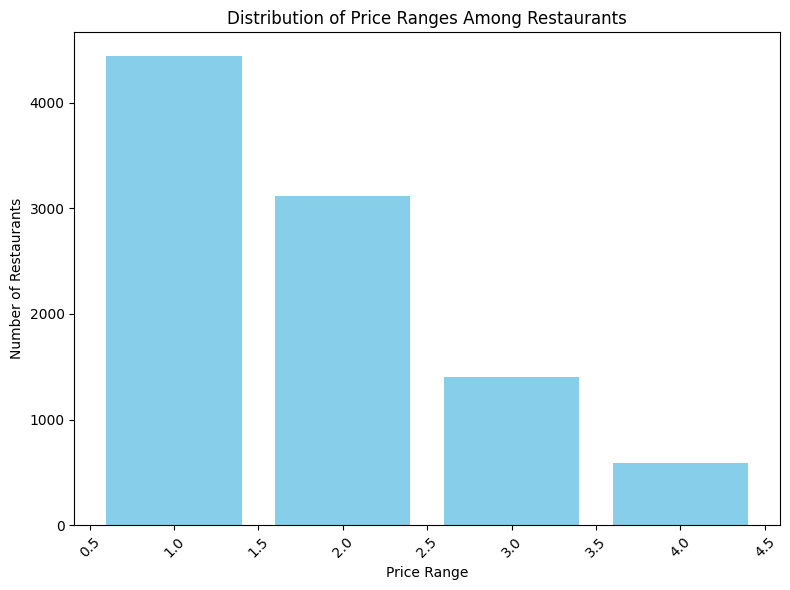

In [55]:
import matplotlib.pyplot as plt

# Assuming 'price_range' is the column name containing price range information in your DataFrame 'df'
price_range_counts = df['Price range'].value_counts()

# Plotting the bar chart
plt.figure(figsize=(8, 6))  # Adjust the figure size as necessary
plt.bar(price_range_counts.index, price_range_counts.values, color='skyblue')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.title('Distribution of Price Ranges Among Restaurants')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability if needed
plt.tight_layout()
plt.show()


In [58]:
price_range_counts = df['Price range'].value_counts()
total_restaurants = len(df)
for price_range, count in price_range_counts.items():
    percentage = (count / total_restaurants) * 100
    print(f"Percentage of restaurants in {price_range}: {percentage:.2f}%")


Percentage of restaurants in 1: 46.53%
Percentage of restaurants in 2: 32.59%
Percentage of restaurants in 3: 14.74%
Percentage of restaurants in 4: 6.14%


In [70]:
df = pd.read_csv('Dataset .csv')

In [71]:
df['Has Online delivery'].value_counts()

Has Online delivery
No     7100
Yes    2451
Name: count, dtype: int64

In [72]:
restaurants = round(df['Has Online delivery'].value_counts(normalize=True) *100, 2)
print(restaurants)

Has Online delivery
No     74.34
Yes    25.66
Name: proportion, dtype: float64


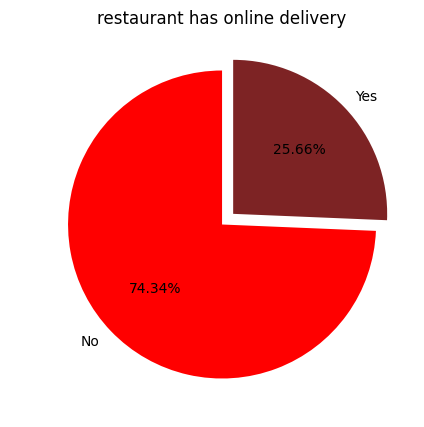

In [81]:
plt.figure(figsize = (5,5))
restaurants.plot(kind='pie', autopct = '%1.2f%%', labels=restaurants.index,
                 colors = ('Red', '#7D2324'), explode = (0, 0.1),
                 radius=1, startangle = 90)
plt.title("restaurant has online delivery")
plt.ylabel(' ')
plt.show()         

In [31]:
ratings = df['Aggregate rating'].dropna()

rating_counts = ratings.value_counts().sort_index()
most_common_rating_range = rating_counts.idxmax(), rating_counts.max()

most_common_rating_range

(0.0, 2148)

In [60]:
avg_restaurant_votes=df.groupby(['Restaurant Name'])['Votes'].mean().reset_index().sort_values(by='Votes', ascending=False)
avg_restaurant_votes.head(5)

,Restaurant Name,Votes
6943,Toit,10934.0
2879,Hauz Khas Social,7931.0
4902,Peter Cat,7574.0
783,Big Brewsky,5705.0
6449,The Black Pearl,5385.0


In [58]:
average_votes = df['Votes'].mean()
print(f'Average number of votes by restaurants: {average_votes:.2f}')

Average number of votes by restaurants: 156.91


In [5]:
import pandas as pd
from collections import Counter

df = df[df['Cuisines'].apply(lambda x: isinstance(x, str))]
df['cuisine_combination'] = df['Cuisines'].str.split(',')
df['cuisine_combination'] = df['cuisine_combination'].apply(lambda x: tuple(sorted(cuisine.strip() for cuisine in x)))
common_cuisine_count = Counter(df['cuisine_combination'])
common_cuisine = common_cuisine_count.most_common(3)
print(f'Most common cuisines: {common_cuisine}')
for combo, Count in common_cuisine:
     print(f"{combo}: {Count} times")


Most common cuisines: [(('North Indian',), 936), (('Chinese', 'North Indian'), 616), (('Mughlai', 'North Indian'), 394)]
('North Indian',): 936 times
('Chinese', 'North Indian'): 616 times
('Mughlai', 'North Indian'): 394 times


In [8]:
import pandas as pd

df = pd.read_csv('Dataset .csv')
df = df.explode('Cuisines')

average_ratings_of_cuisines = df.groupby('Cuisines')['Aggregate rating'].mean().reset_index().sort_values(by='Aggregate rating')
top_10_ratings = average_ratings_of_cuisines.nlargest(10, 'Aggregate rating')
print("Top 10 Cuisine Combinations with Highest Average Rating:")
print(top_10_ratings)

Top 10 Cuisine Combinations with Highest Average Rating:
                          Cuisines  Aggregate rating
1779             Sunda, Indonesian               4.9
1822                 World Cuisine               4.9
93         American, Sandwich, Tea               4.9
683            Continental, Indian               4.9
1286             Mughlai, Lucknowi               4.9
169       BBQ, Breakfast, Southern               4.9
1062                 Italian, Deli               4.9
1034  Italian, Bakery, Continental               4.9
803         European, Contemporary               4.9
41        American, Coffee and Tea               4.9


In [11]:
import folium
from folium.plugins import MarkerCluster

In [20]:
coordinates = df[['Latitude', 'Longitude', 'Restaurant Name']].dropna()
map_center = [coordinates['Longitude'].mean(), coordinates['Latitude'].mean()]
my_map = folium.Map(location=map_center, zoom_start=12)

marker_cluster = MarkerCluster().add_to(my_map)
for idx, row in coordinates.iterrows():
    folium.Marker(
        location=[row["Longitude"], row["Latitude"]],
        popup=row["Restaurant Name"],
    ).add_to(marker_cluster)

my_map

In [23]:
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings

<function warnings.filterwarnings(action, message='', category=<class 'Warning'>, module='', lineno=0, append=False)>

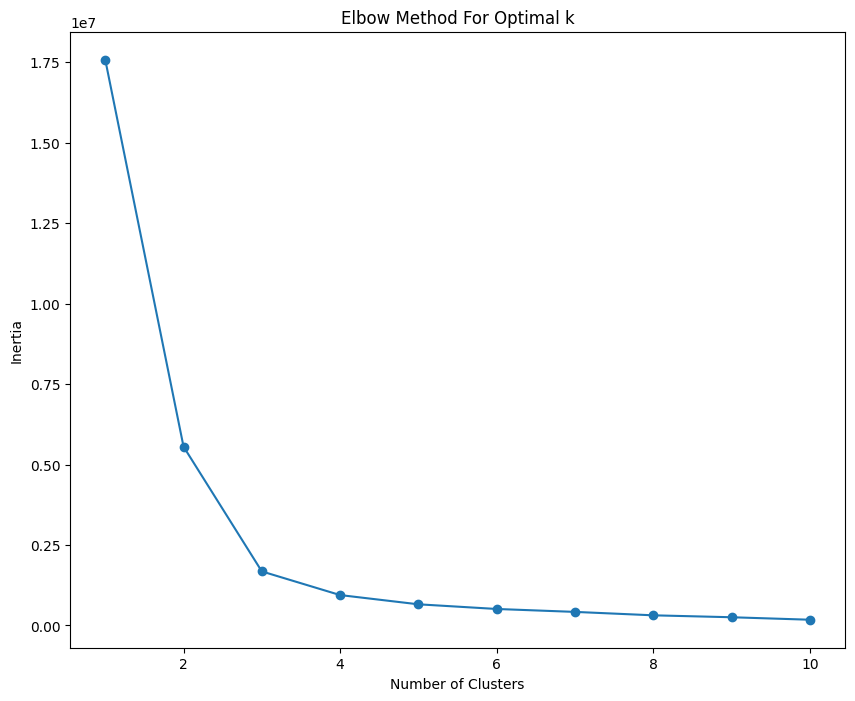

In [22]:
df = df[['Latitude', 'Longitude']].dropna()
coords = df[['Latitude', 'Longitude']].values
inertia = []
for n in range(1, 11):
    kmeans = KMeans(n_clusters=n, random_state=42).fit(coords)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 8))
plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k')
plt.show()

In [38]:
duplicate_names = df['Restaurant Name'].value_counts()
chains = duplicate_names[duplicate_names > 1]

print(f'Restaurant chains present in the dataset: ')
print(chains)

Restaurant chains present in the dataset: 
Restaurant Name
Cafe Coffee Day       83
Domino's Pizza        79
Subway                63
Green Chick Chop      51
McDonald's            48
                      ..
Town Hall              2
Halki Aanch            2
Snack Junction         2
Delhi Biryani Hut      2
Beliram Degchiwala     2
Name: count, Length: 734, dtype: int64


In [42]:
chains_df = df[df['Restaurant Name'].isin(chains.index)]
chain_popularity = chains_df.groupby('Restaurant Name').agg({
    'Aggregate rating': 'mean',
    'Votes': 'sum'
}).reset_index()

chain_popularity.columns = ['Restaurant Name', 'Aggregate rating', 'Votes']

chain_sorted_by_rating = chain_popularity.sort_values(by='Aggregate rating', ascending=False)
chain_sorted_by_votes = chain_popularity.sort_values(by='Votes', ascending=False)

print("Ratings and popularity of different restaurant chains:")
print(chain_popularity)

Ratings and popularity of different restaurant chains:
          Restaurant Name  Aggregate rating  Votes
0       10 Downing Street          4.000000    670
1      221 B Baker Street          3.366667    215
2      34 Parkstreet Lane          3.050000     31
3    34, Chowringhee Lane          2.791667    777
4          4700BC Popcorn          3.500000    176
..                    ...               ...    ...
729                 Zaika          2.850000    245
730     Zaika Kathi Rolls          1.500000     16
731                  Zizo          3.866667   1371
732       Zooby's Kitchen          3.150000     52
733                bu��no          3.750000    117

[734 rows x 3 columns]


In [14]:
positive_keywords = ["Good", "Excellent", "Very good"]
negative_keywords = ["Poor", "Not rated", "Average"]

positive_count = {keyword: 0 for keyword in positive_keywords}
negative_count = {keyword: 0 for keyword in negative_keywords}

# Count occurrences 
for review in df['Rating text']:
    if review in positive_keywords:
        positive_count[review] += 1
    elif review in negative_keywords:
        negative_count[review] += 1

# counts
print("Positive Keyword Counts:", positive_count)
print("Negative Keyword Counts:", negative_count)

# most common positive and negative keywords
most_common_positive = max(positive_count, key=positive_count.get)
most_common_negative = max(negative_count, key=negative_count.get)
#print the words
print("\nMost Common Positive Keyword:", most_common_positive)
print("Most Common Negative Keyword:", most_common_negative)


Positive Keyword Counts: {'Good': 2100, 'Excellent': 301, 'Very good': 0}
Negative Keyword Counts: {'Poor': 186, 'Not rated': 2148, 'Average': 3737}

Most Common Positive Keyword: Good
Most Common Negative Keyword: Average


In [12]:
# length of each review
df['Review_length'] = df['Rating text'].apply(len)

# average length of reviews
average_review_length = df['Review_length'].mean()

relationship = df[['Review_length', 'Aggregate rating']].corr()
average_review_length, relationship

(7.020730813527379,
                   Review_length  Aggregate rating
 Review_length          1.000000         -0.478885
 Aggregate rating      -0.478885          1.000000)

In [13]:
df = pd.read_csv('Dataset .csv')

In [14]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [15]:
df=df.dropna(subset=['Votes'])

max_votes = df.loc[df['Votes'].idxmax()]
min_votes = df.loc[df['Votes'].idxmin()]
print("Restaurant with the highest votes:")
print(f"Name: {max_votes['Restaurant Name']}, Votes: {max_votes['Votes']}")
print("Restaurant with the lowest votes:")
print(f"Name: {min_votes['Restaurant Name']}, Votes: {min_votes['Votes']}")

Restaurant with the highest votes:
Name: Toit, Votes: 10934
Restaurant with the lowest votes:
Name: Cantinho da Gula, Votes: 0


Pearson correlation coefficient: 0.31
P-value: 0.00


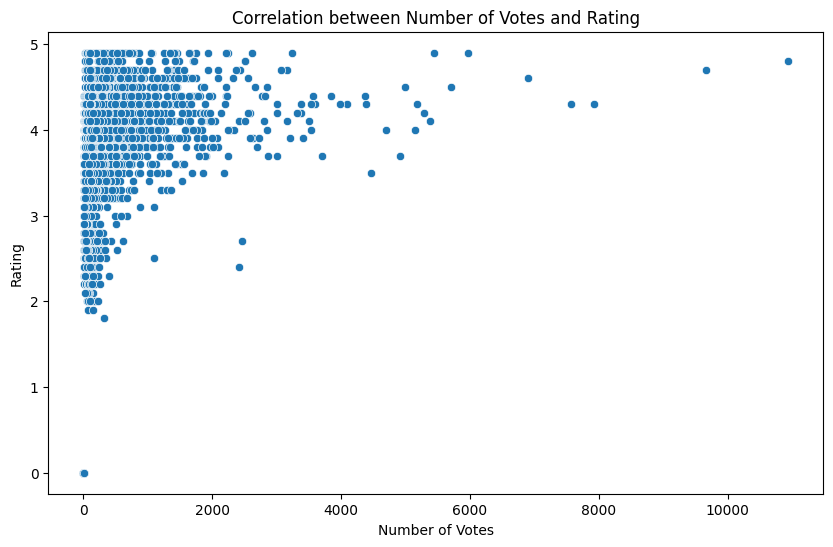

In [24]:
correlation, p_value = pearsonr(df['Votes'], df['Aggregate rating'])

print(f"Pearson correlation coefficient: {correlation:.2f}")
print(f"P-value: {p_value:.2f}")

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Votes', y='Aggregate rating', data=df)
plt.title('Correlation between Number of Votes and Rating')
plt.xlabel('Number of Votes')
plt.ylabel('Rating')
plt.show()

Chi-square test for price range and online delivery:
Chi2 Statistic: 721.38, P-value: 0.0000

Chi-square test for price range and table booking:
Chi2 Statistic: 2821.58, P-value: 0.0000


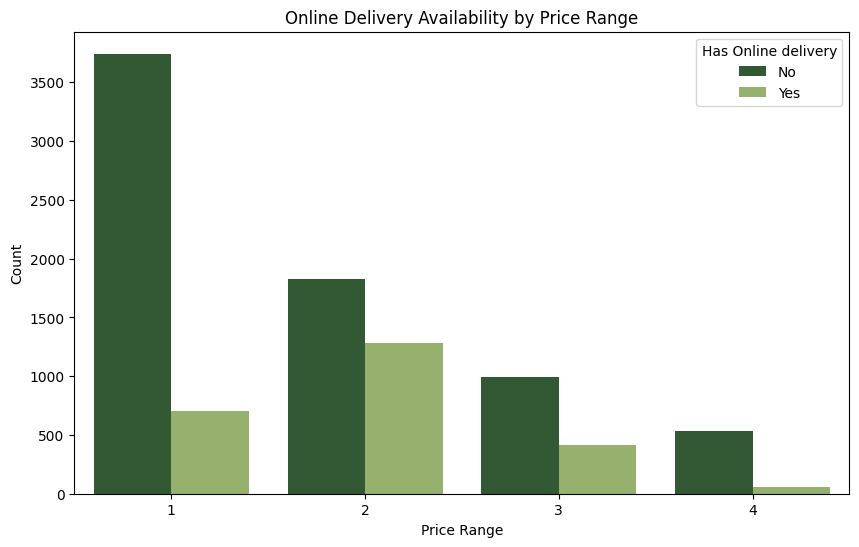

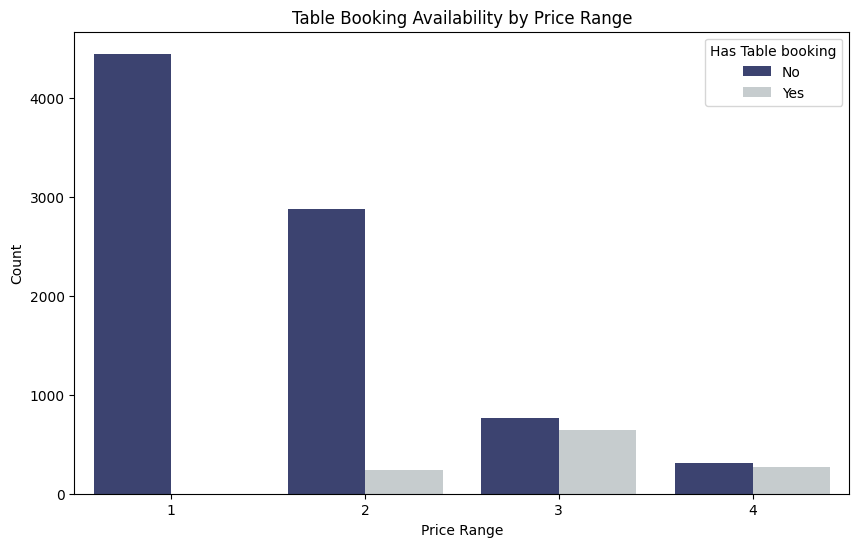

In [41]:
online_delivery = pd.crosstab(df['Price range'], df['Has Online delivery'])
chi2_online_delivery, p_online_delivery, _, _ = chi2_contingency(online_delivery)

# Relationship between price range and table booking
table_booking = pd.crosstab(df['Price range'], df['Has Table booking'])
chi2_table_booking, p_table_booking, _, _ = chi2_contingency(table_booking)

# Print the results
print("Chi-square test for price range and online delivery:")
print(f"Chi2 Statistic: {chi2_online_delivery:.2f}, P-value: {p_online_delivery:.4f}")
print("\nChi-square test for price range and table booking:")
print(f"Chi2 Statistic: {chi2_table_booking:.2f}, P-value: {p_table_booking:.4f}")

# Online delivery by price range
plt.figure(figsize=(10, 6))
custom_palette = ['#2C5F2D', '#97BC62']
sns.countplot(data=df, x='Price range', hue='Has Online delivery', palette=custom_palette)
plt.title('Online Delivery Availability by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Count')
plt.show()

# Table booking by price range
plt.figure(figsize=(10, 6))
custom_palette = ['#333D79FF', '#C5CCCF']
sns.countplot(data=df, x='Price range', hue='Has Table booking', palette=custom_palette)
plt.title('Table Booking Availability by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Count')
plt.show()